# IMPORTS

In [4]:
# Functions for data
from src.data_processing import data as dt
from src.data_processing import image_transformation as it
from data_processing import image_aumentation as ia
from src.scripts import pipelines as pipe

# Utils
from src.utils.settings import Settings
from src.utils.loss_functions import Loss, get_loss_name
from src.utils import utils

# Models
from src.models import model_testing as m_test 
from src.models import model_training as m_train 
from src.models import model_settings as m_settings

# Lybraries
import torch
import os

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [9]:
# For testing remove limit on print
torch.set_printoptions(threshold=float('inf'))

# PLAYING WITH IMAGES

### All implemented transformations to expand the dataset

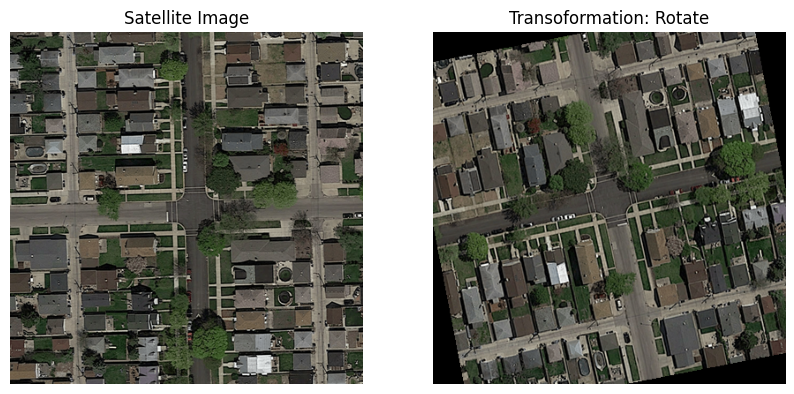

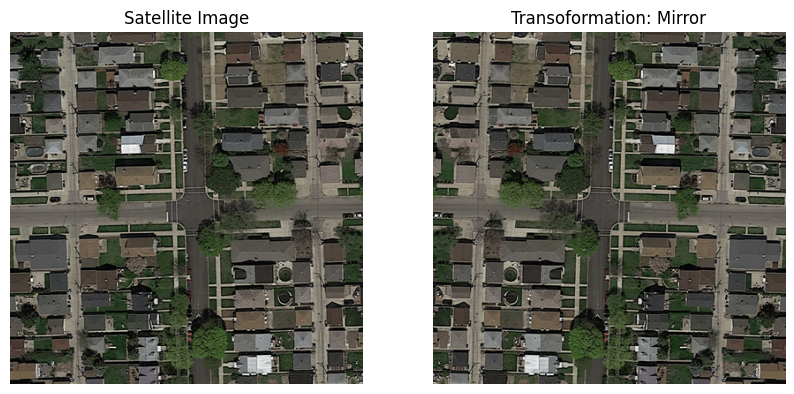

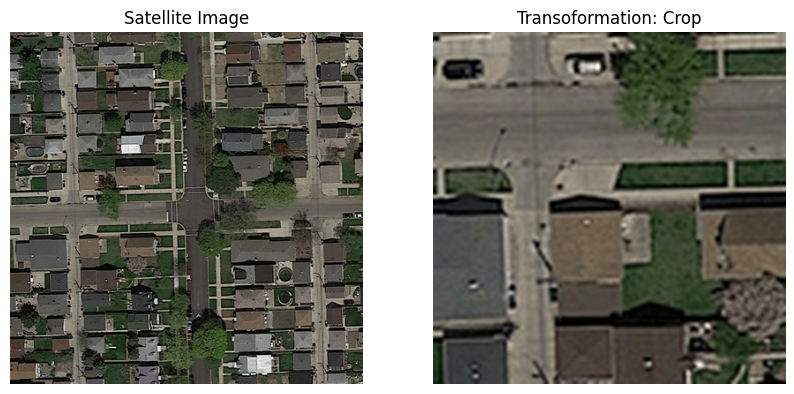

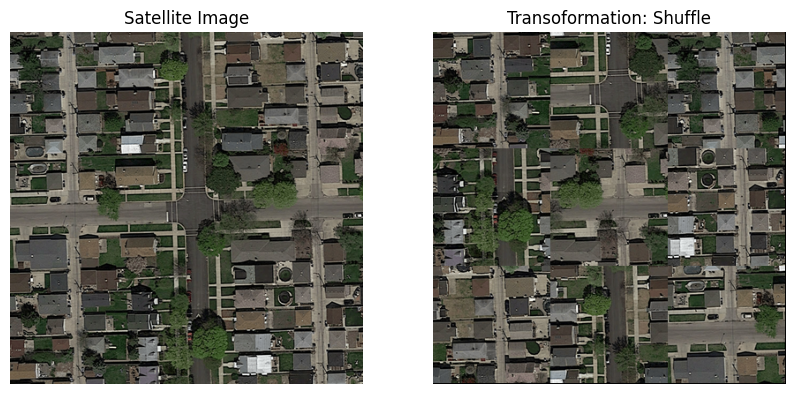

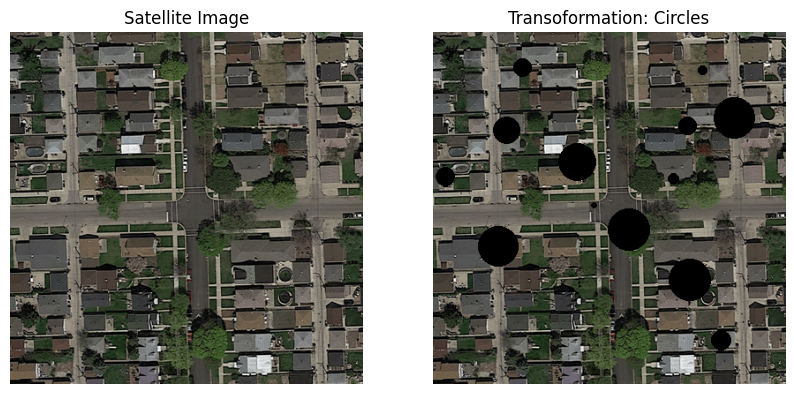

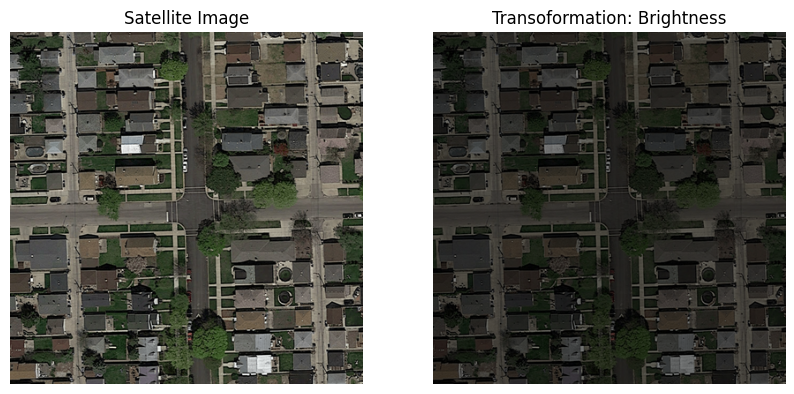

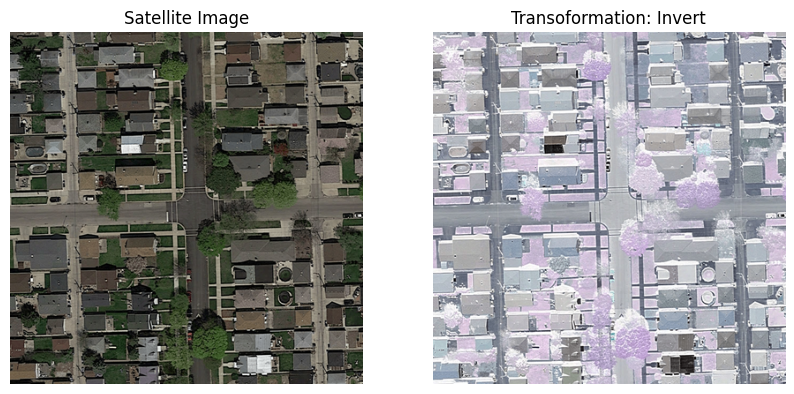

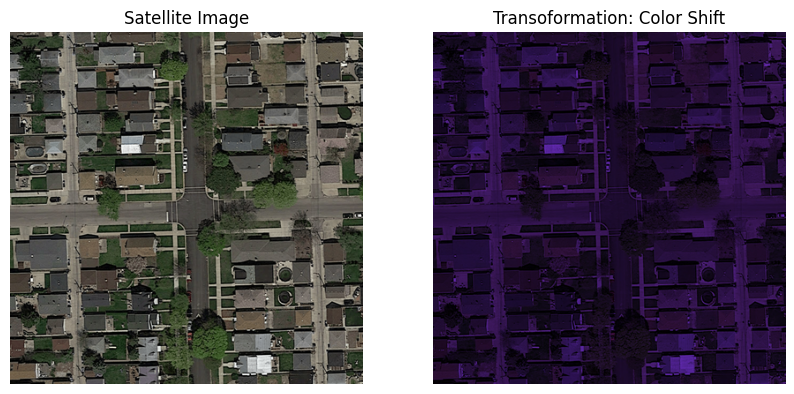

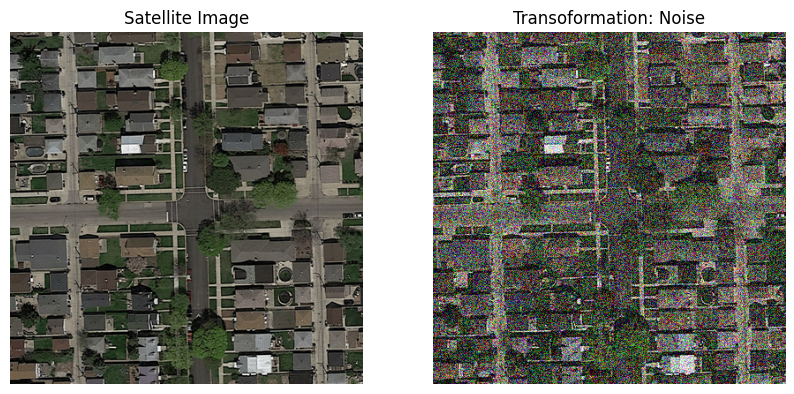

In [19]:
image_in = r"data\training\images\satImage_001.png"  # Replace with your image file
#truth_in = "data/training/training/groundtruth/satImage_0000001.png"  # Replace with your image file
seed = 42**2

image = dt.load_image_from_directory(image_in)

transformations = [
# ROTATE
(it.rotate_image(image, seed),"Rotate"),
# MIRROR
(it.mirror_image(image),"Mirror"),
# SCALE
(it.random_subimage(image, seed),"Crop"),
# SHUFFLE
(it.shuffle_image(image, seed),"Shuffle"),
# HOLES
(it.add_random_circles(image, seed),"Circles"),
# BRIGHTNESS
(it.set_brightness(image, seed),"Brightness"),
#INVERT
(it.invert_colors(image),"Invert"),
#COLOR SHIFT
(it.shift_color_towards_random(image, seed),"Color Shift"),
#NOISE
(it.add_noise_to_image(image, seed),"Noise"),
]
for transformation, name in transformations:
    dt.display_images_side_by_side_pil(image, transformation, right_text=f"Transoformation: {name}")


### Image expansion: _Single transformation pipeline example_

In [38]:
image_in = r"data/training/images/satImage_001.png"  # Replace with your image file
truth_in = r"data/training/groundtruth/satImage_001.png"  # Replace with your image file

out_dir = r"data/examples"

os.makedirs(out_dir, exist_ok=True)
os.makedirs(fr"{out_dir}\images", exist_ok=True)
os.makedirs(fr"{out_dir}\groundtruth", exist_ok=True)
sample_image = it.SamplePoint(image_in, truth_in)

In [39]:
settings = Settings()
ia.apply_pipeline(sample_image, pipe.single_pipelines, 1, out_dir, settings)

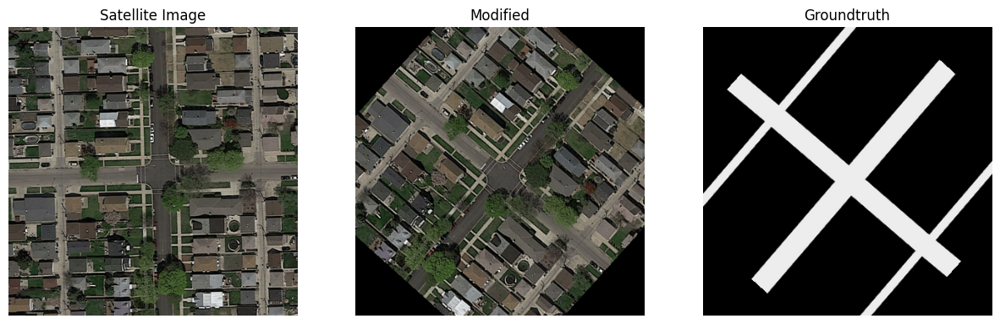

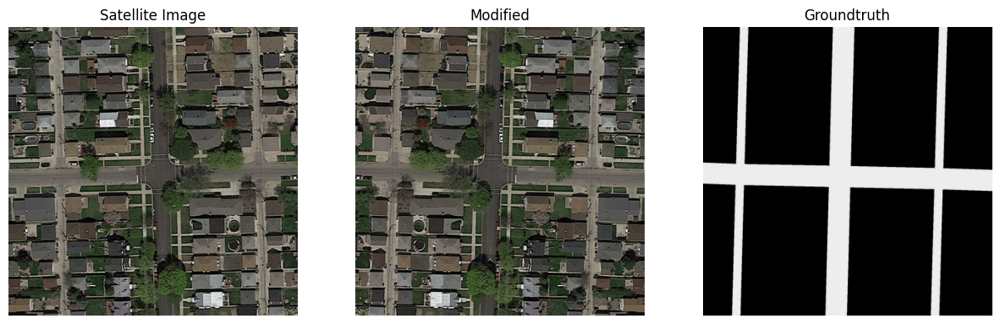

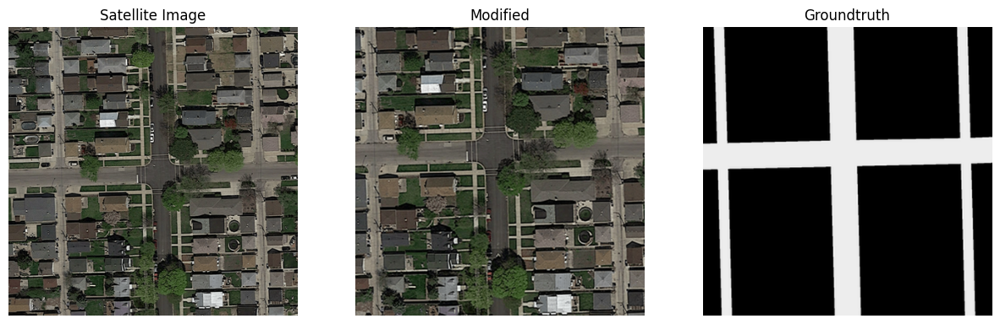

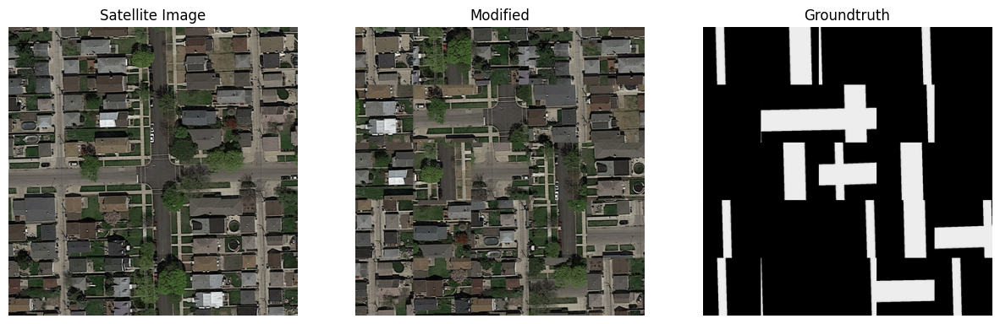

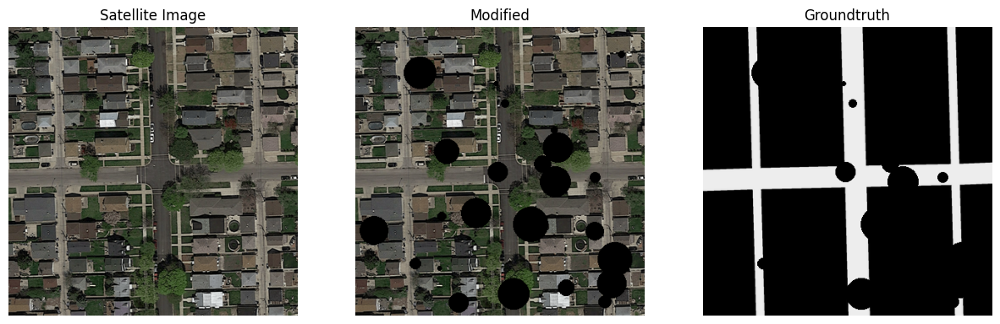

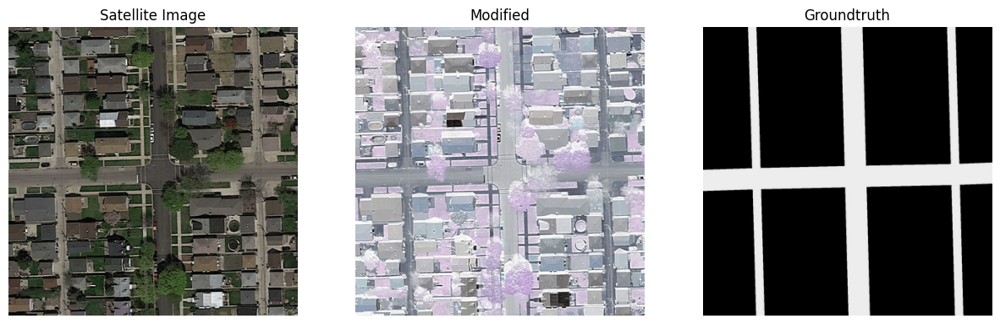

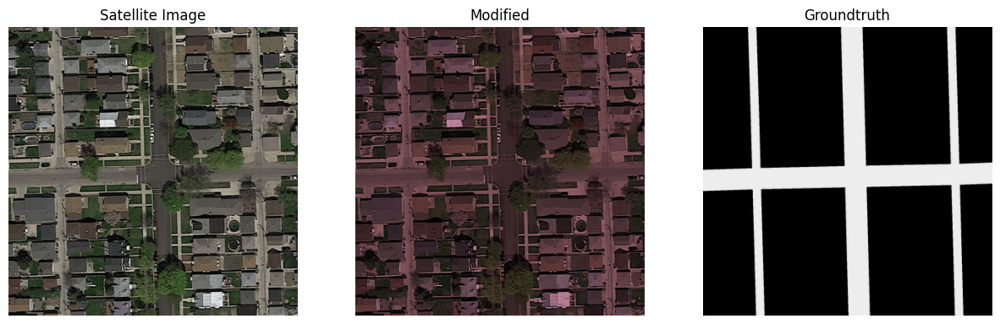

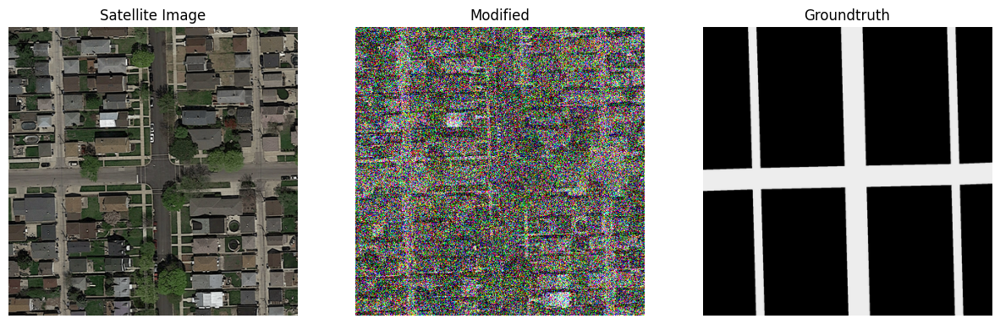

In [27]:
image_in = r"data/training/images/satImage_001.png"  # Replace with your image file
original = dt.load_image_from_directory(image_in)

# Expanded images
images = []
for i in range(1,9):
    images.append(it.SamplePoint(f"data/examples/images/satImage_1_1_{i}.png", f"data/examples/groundtruth/satImage_1_1_{i}.png"))

images_PIL = []
truths_PIL = []
for image in images:
    images_PIL.append(dt.load_image_from_directory(image.get_image()))
    truths_PIL.append(dt.load_image_from_directory(image.get_groundtruth()))

for i, image in enumerate(images_PIL):
    dt.display_three_images(original, images_PIL[i], truths_PIL[i])

### Create Simple transformation images set

Create a small dataset with some transformations and subdivisions

In [ ]:
settings = Settings()

ia.create_training_data(
    sample_directory=r"data\training",
    output_directory=r"data", 
    output_directory_name=r"base", #Creates another folder inside "output_directory" with two folders: Images and GroundTruth
    pipelines=pipe.simple_pipeline, # Select the desired pipeline
    settings=settings,
    n_divisions=1
)

### Create BIG transformation image set

Recomended to have a lot of space in memory to execute. It will create around 390.000 images starting from the 100 originals. We create 3000 variations from each base and splited image.
$$
3000 \times \left( 1 + 9 + \binom{9}{2} + \binom{9}{3} \right) =390.000
$$

In [ ]:
settings = Settings()

ia.create_training_data(
    sample_directory=r"data\training",
    output_directory=r"data", 
    output_directory_name=r"custom", #Creates another folder inside "output_directory" with two folders: Images and GroundTruth
    pipelines=pipe.full_pipelines, # Select the desired pipeline
    settings=settings,
    n_divisions=3
)

All the transformations applied to the groundtruth images have a single black and white channel. Yet, if you need to make other images have this feature you can

In [ ]:
ia.ensure_monochannel(settings.CUSTOM_GT_RUTE)

# MODEL TRAINING 

Examples of possible ways to train each model 

### Convolutional Network: _SegNet_

In [ ]:
settings = Settings(LOSS=Loss.DICE)
model_settings = m_settings.Segnet()
model_name = f"segnet_{get_loss_name(settings.LOSS)}_k{model_settings.KS}_lr{model_settings.LR}"
model_to_test = m_settings.get_model_from_settings(model_settings)

m_train.start_training_settings(
    model=model_to_test, 
    model_name=model_name,
    settings=settings,
    model_settings=model_settings,
    origin="Custom"
)
 
m_test.test_model_batch_by_batch(model_to_test, settings, model_settings, origin="Custom")                      
del model_to_test

### Convolutional Network: _UNet_

Training with 86 images: 8 batches + 6 extra
Validating with 8 images: 0 batches + 8 extra

SETTINGS:
 · General Settings for trainig:
   - Foreground Threshold: 0.25
   - Training Range: 0.00% to 85.00%
   - Validation Range: 85.00% to 92.50%
   - Test Range: 92.50% to 100.00%
   - Max Nº of Epochs: 100
   - Verbose Interval: 250
   - Loss: DICE
   - Batch Size: 10
   - Patience for Early Stopping: 5
   - Patience margin for Early Stopping: 0.01
 · Model Settings:
   - LR: 0.001
   - STEP_SIZE: 7
   - GAMMA: 0.7
   - THRESHOLD: 0.5
   - PRETRAINED: True

------------------------------------------
TRAINING BEGINS...

Epoch: 00, Learning Rate: 0.001
  - Started training...
  - loading 85 images...
 · Trained 85 samples, Loss: 0.6049
  - loading 7 images...
 · Validation loss (7 samples): 1.0000
Epoch: 01, Learning Rate: 0.001
  - Started training...
  - loading 85 images...
 · Trained 85 samples, Loss: 0.4846
  - loading 7 images...
 · Validation loss (7 samples): 0.7380
Epoch: 02, Lear

c:\Users\mique\OneDrive - UPV\.Importantes\.Uni\Cursos\4rt\MAL\Proyect\ml-project-2-cnn-crunchy-nugget-network\src\data_processing\data.py:148: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  images = torch.stack([torch.tensor(img) for img in images], dim=0)


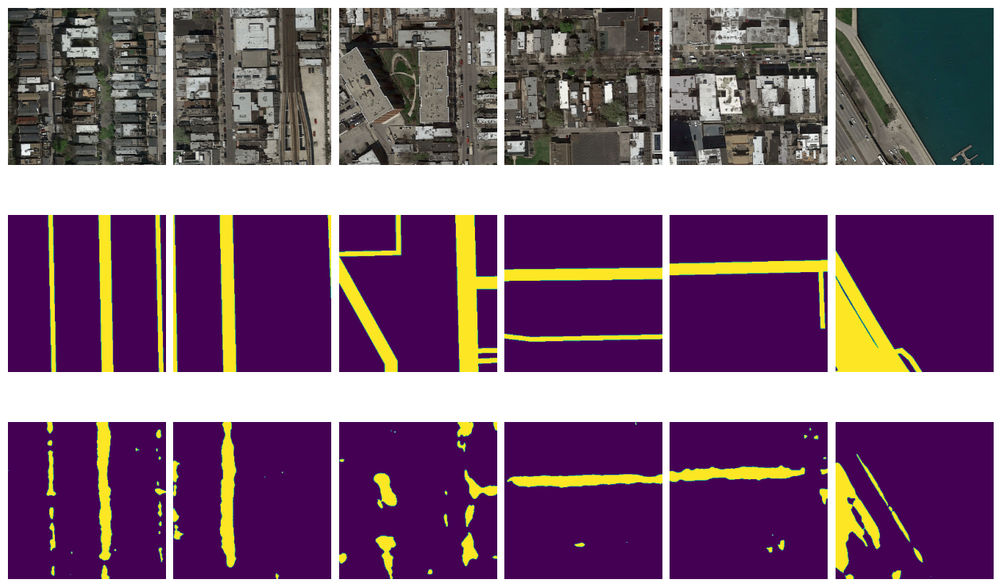

In [5]:
settings = Settings(
    LOSS=Loss.DICE, 
    END_TRAIN_P=0.85, 
    START_VALIDATION_P=0.85,
    END_VALIDATION_P=0.925,
    START_TEST_P=0.925,
    END_TEST_P=1.000
)
model_settings = m_settings.UNet()
model_name = f"unet_ori_{get_loss_name(settings.LOSS)}_lr{model_settings.LR}"

model_to_test = m_settings.get_model_from_settings(model_settings)
m_train.start_training_settings(
    model=model_to_test, 
    model_name=model_name,
    settings=settings,
    model_settings=model_settings,
    origin="Ori"
)
 
m_test.test_model_batch_by_batch(model_to_test, settings, model_settings, origin="Ori")           
del model_to_test

### Transformer: _Segmentation with vision transformer_

In [ ]:
settings = Settings(LOSS=Loss.DICE)
model_settings = m_settings.ViT()
model_name = f"vit_{get_loss_name(settings.LOSS)}_lr{model_settings.LR}"

model_to_test = m_settings.get_model_from_settings(model_settings)
m_train.start_training_settings(
    model=model_to_test, 
    model_name=model_name,
    settings=settings,
    model_settings=model_settings,
    origin="Custom"
)
            
m_test.test_model_batch_by_batch(model_to_test, settings, model_settings, origin="Custom")           
del model_to_test

# Load model from memory to test

  - loading 6 images...
Model loss over all testing (6 images):
  - ACURACY: 0.0489
  - FSCORE: 0.8610
  - BCE: 0.6561
  - IOU: 0.2412
  - IOU_STABLE: 0.2790
  - DICE: 0.1384


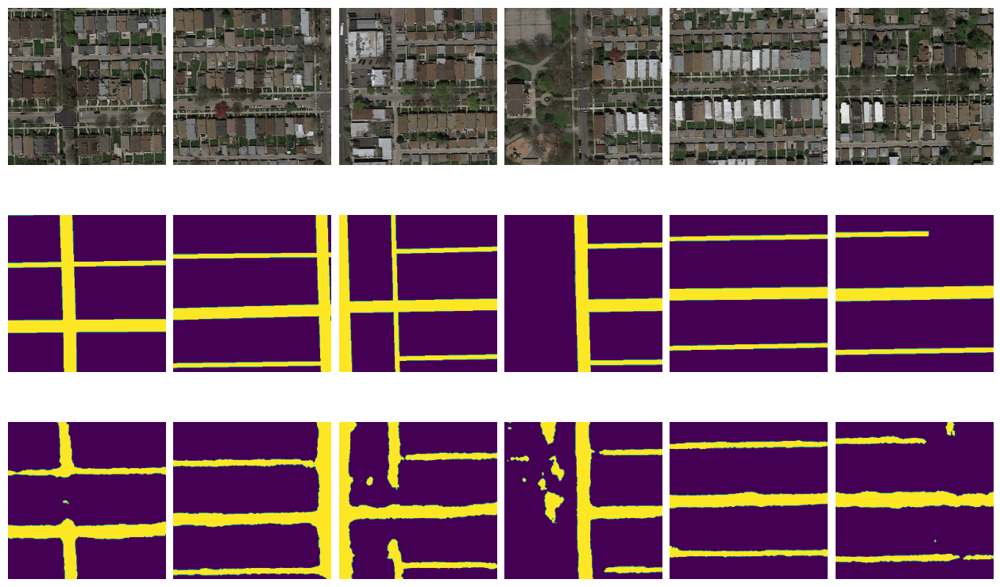

[0.04890519380569458,
 0.8609664440155029,
 0.6561457514762878,
 0.24119015038013458,
 0.2789544463157654,
 0.13838398456573486]

In [34]:
settings = Settings(
    START_TEST_P=11,
    END_TEST_P=17,
)

# Select the type of model in the settings
model_settings = m_settings.Segnet() # <---- IMPORTANT!
model_to_test = m_settings.get_model_from_settings(model_settings)
utils.load_model(model_to_test, "segnet_regalito_custom_testing_epoch_0062")

m_test.test_model_batch_by_batch(model_to_test, settings, model_settings, origin="Ori")

### Compare model trough epochs
Example of simple execution of a unet with base-expanded data

unet_ori_DICE_lr0.001_epoch_0000
  - loading 8 images...
Model loss over all testing (8 images):
  - ACURACY: 0.7340
  - FSCORE: 0.0000
  - BCE: 0.6931
  - IOU: 1.0000
  - IOU_STABLE: 11.5129
  - DICE: 1.0000


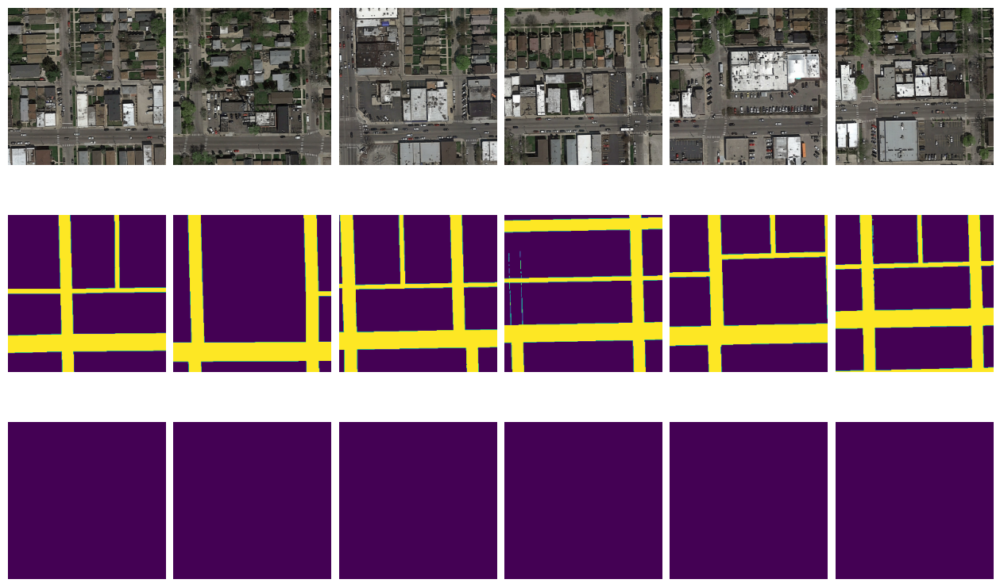

unet_ori_DICE_lr0.001_epoch_0001
  - loading 8 images...
unet_ori_DICE_lr0.001_epoch_0002
  - loading 8 images...
unet_ori_DICE_lr0.001_epoch_0003
  - loading 8 images...
unet_ori_DICE_lr0.001_epoch_0004
  - loading 8 images...
unet_ori_DICE_lr0.001_epoch_0005
  - loading 8 images...
Model loss over all testing (8 images):
  - ACURACY: 0.7693
  - FSCORE: 0.2992
  - BCE: 0.6831
  - IOU: 0.8259
  - IOU_STABLE: 1.8874
  - DICE: 0.7148


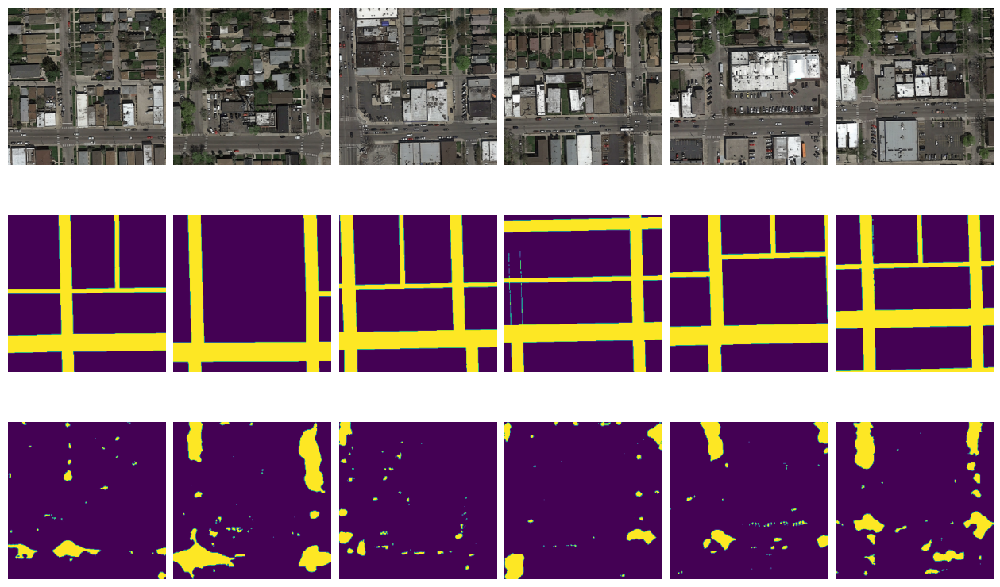

unet_ori_DICE_lr0.001_epoch_0006
  - loading 8 images...
unet_ori_DICE_lr0.001_epoch_0007
  - loading 8 images...
unet_ori_DICE_lr0.001_epoch_0008
  - loading 8 images...
unet_ori_DICE_lr0.001_epoch_0009
  - loading 8 images...
unet_ori_DICE_lr0.001_epoch_0010
  - loading 8 images...
Model loss over all testing (8 images):
  - ACURACY: 0.8615
  - FSCORE: 0.7139
  - BCE: 0.6556
  - IOU: 0.4307
  - IOU_STABLE: 0.5924
  - DICE: 0.2833


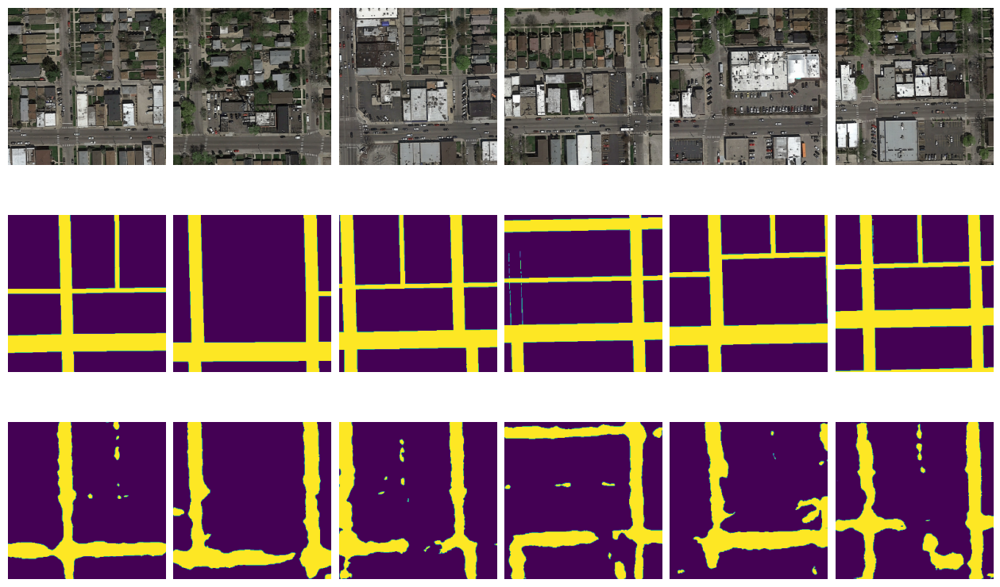

unet_ori_DICE_lr0.001_epoch_0011
  - loading 8 images...
unet_ori_DICE_lr0.001_epoch_0012
  - loading 8 images...
unet_ori_DICE_lr0.001_epoch_0013
  - loading 8 images...
unet_ori_DICE_lr0.001_epoch_0014
  - loading 8 images...
unet_ori_DICE_lr0.001_epoch_0015
  - loading 8 images...
Model loss over all testing (8 images):
  - ACURACY: 0.8630
  - FSCORE: 0.7551
  - BCE: 0.6639
  - IOU: 0.3737
  - IOU_STABLE: 0.4975
  - DICE: 0.2394


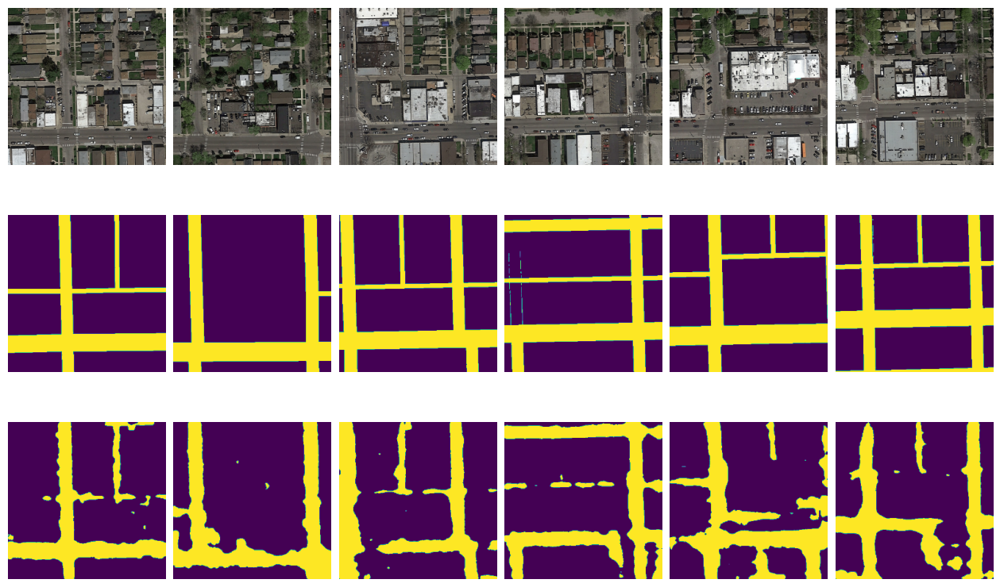

unet_ori_DICE_lr0.001_epoch_0016
  - loading 8 images...
unet_ori_DICE_lr0.001_epoch_0017
  - loading 8 images...
unet_ori_DICE_lr0.001_epoch_0018
  - loading 8 images...
unet_ori_DICE_lr0.001_epoch_0019
  - loading 8 images...
unet_ori_DICE_lr0.001_epoch_0020
  - loading 8 images...
Model loss over all testing (8 images):
  - ACURACY: 0.8746
  - FSCORE: 0.7751
  - BCE: 0.6579
  - IOU: 0.3471
  - IOU_STABLE: 0.4503
  - DICE: 0.2183


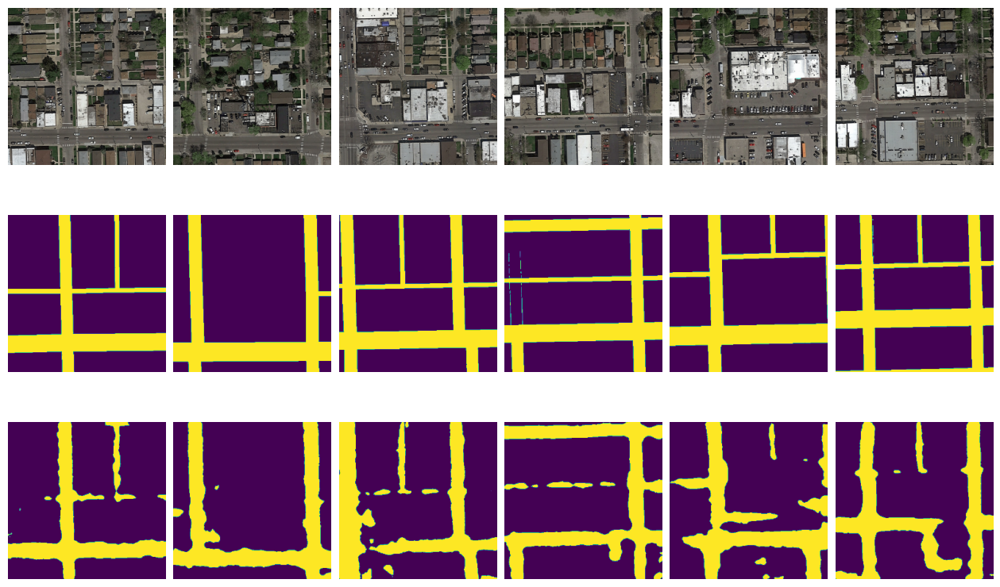

unet_ori_DICE_lr0.001_epoch_0021
  - loading 8 images...
unet_ori_DICE_lr0.001_epoch_0022
  - loading 8 images...
unet_ori_DICE_lr0.001_epoch_0023
  - loading 8 images...
unet_ori_DICE_lr0.001_epoch_0024
  - loading 8 images...
unet_ori_DICE_lr0.001_epoch_0025
  - loading 8 images...
Model loss over all testing (8 images):
  - ACURACY: 0.8782
  - FSCORE: 0.7824
  - BCE: 0.6563
  - IOU: 0.3356
  - IOU_STABLE: 0.4331
  - DICE: 0.2101


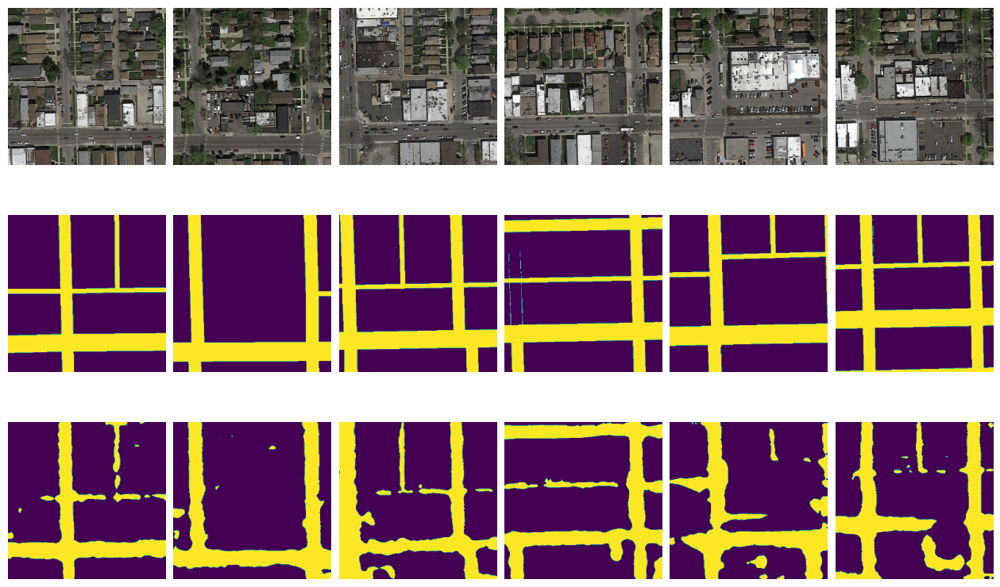

unet_ori_DICE_lr0.001_epoch_0026_FINAL
  - loading 8 images...


In [35]:
settings = Settings(
    LOSS=Loss.DICE, 
    END_TRAIN_P=0.85, 
    START_VALIDATION_P=0.85,
    END_VALIDATION_P=0.925,
    START_TEST_P=0.925,
    END_TEST_P=1.000
)
model_settings = m_settings.UNet()
model_to_test = m_settings.get_model_from_settings(model_settings)

all_losses = []
models = ( #list of models names
    [f"unet_ori_DICE_lr0.001_epoch_{i:04d}" for i in range(0,26)] +
    ["unet_ori_DICE_lr0.001_epoch_0026_FINAL"]
)
for i, model_name in enumerate(models):
    print(model_name)
    utils.load_model(model_to_test, model_name)
    losses = m_test.test_model_batch_by_batch(model_to_test, settings, model_settings, origin="Ori", print_images=(i%5 == 0), print_losses=(i%5 == 0))
    all_losses += [(model_name, losses)]

### Plot

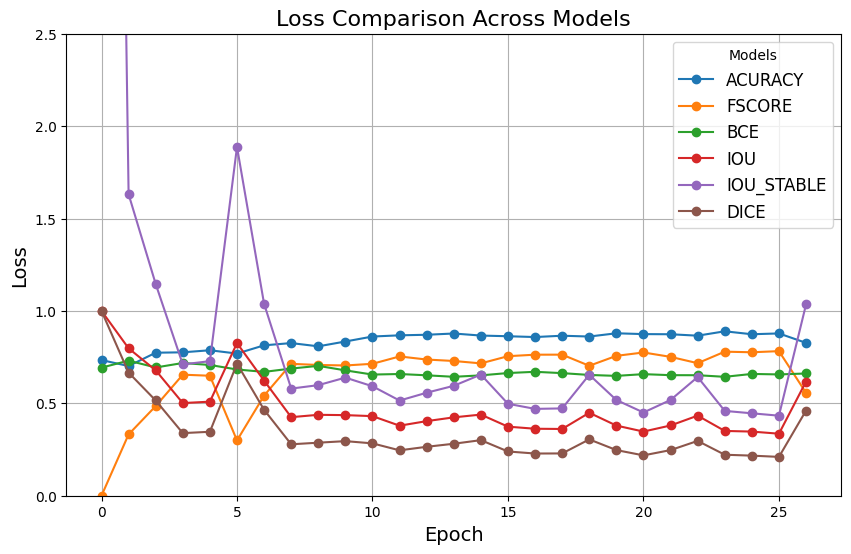

In [36]:
import matplotlib.pyplot as plt
  
transposed_losses = []
for i in range(len(list(Loss.list_options()))):
    transposed_losses.append(
        [losses[i] for _ , losses in all_losses]
    )
    
plt.figure(figsize=(10, 6))  # Create a figure
for i, (loss, name) in enumerate(Loss.list_options()):
    plt.plot(transposed_losses[i], marker="o", label=name)  


# Add title, labels, legend, and grid
plt.title("Loss Comparison Across Models", fontsize=16)
plt.xlabel("Epoch", fontsize=14)
plt.ylabel("Loss", fontsize=14)
plt.ylim(0,2.5)
plt.legend(title="Models", fontsize=12)
plt.grid(True)

# Show the plot
plt.show()

As we can see, at the beggining the model with doing pretty bad. But then the losses go down adn the fscore rises. we finish the training because the model stoped getting better and at the last epoch it starts to overfit and get worse

# Generate submission

c:\Users\mique\OneDrive - UPV\.Importantes\.Uni\Cursos\4rt\MAL\Proyect\ml-project-2-cnn-crunchy-nugget-network\src\models\segmentation_unet.py:56: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this expe

Testing...
Saving images...


c:\Users\mique\OneDrive - UPV\.Importantes\.Uni\Cursos\4rt\MAL\Proyect\ml-project-2-cnn-crunchy-nugget-network\src\data_processing\data.py:149: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  images = torch.stack([torch.tensor(img) for img in images], dim=0)


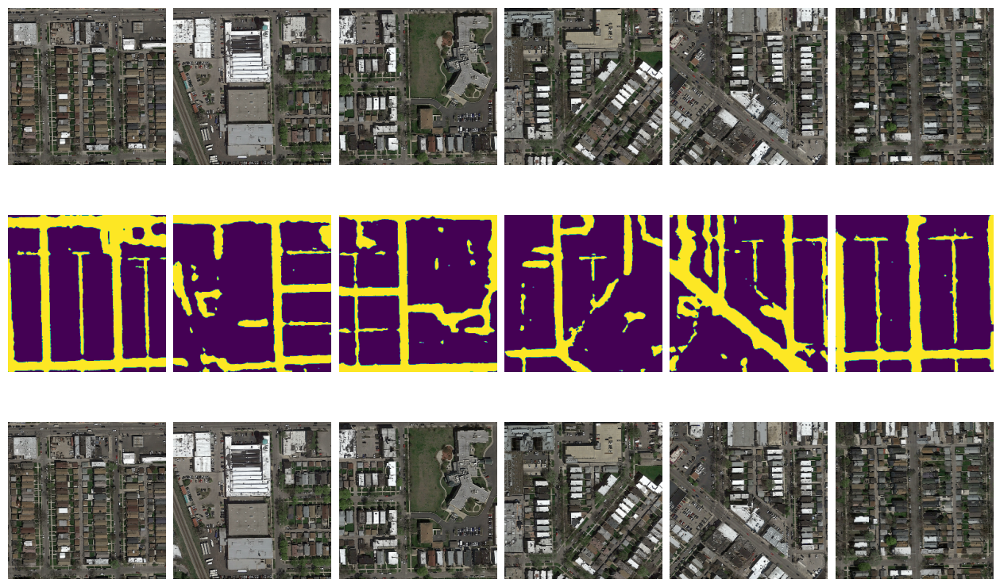

In [24]:
settings = Settings()

model_settings = m_settings.UNet()
model_to_test = m_settings.get_model_from_settings(model_settings)
utils.load_model(model_to_test, "unet_ori_DICE_lr0.001_epoch_0025")

m_test.test_model_submission(model_to_test, settings, model_settings)

### Getting the submission
Run the following comands in terminal
- Generate sumbition `python .\helpers\mask_to_submission.py`
- Visualize submition `python .\helpers\submission_to_mask.py`

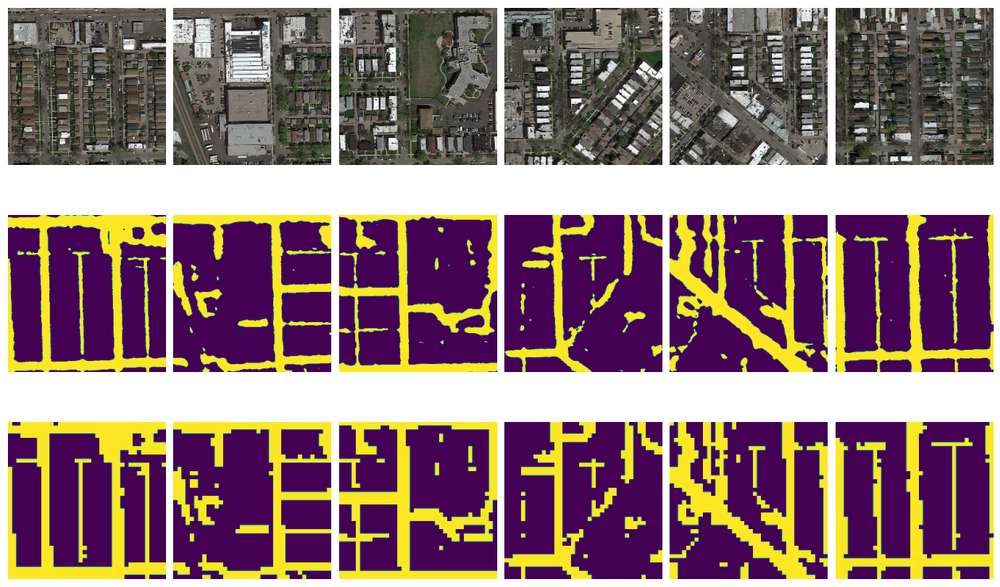

In [25]:
settings = Settings()
m_test.compare_submission_patch_mask(settings, print_times = 1)